In [20]:
import os
import glob
import numpy as np
import random
import matplotlib.pyplot as plt
import plotly.express as px
import wandb
import cv2
import copy

import torch
from torch import nn
from torchinfo import summary
from torchvision.models import vgg19
import torch.nn.functional as F

# Style Transfer

[Arbitrary Style Transfer in Real-time with Adaptive Instance Normalization
](https://arxiv.org/pdf/1703.06868v2.pdf)

content dataset

- [https://cocodataset.org/#download](https://cocodataset.org/#download)

style dataset

- [https://www.kaggle.com/competitions/painter-by-numbers/data](https://www.kaggle.com/competitions/painter-by-numbers/data)

## Data

In [132]:
style_path = glob.glob('data/styles/*.jpg')
content_path = glob.glob('data/content/*.jpg')

In [133]:
print(style_path[:5])
print(content_path[:5])

['data/styles/9733.jpg', 'data/styles/91159.jpg', 'data/styles/96636.jpg', 'data/styles/97528.jpg', 'data/styles/90247.jpg']
['data/content/000000182611.jpg', 'data/content/000000335177.jpg', 'data/content/000000278705.jpg', 'data/content/000000463618.jpg', 'data/content/000000568981.jpg']


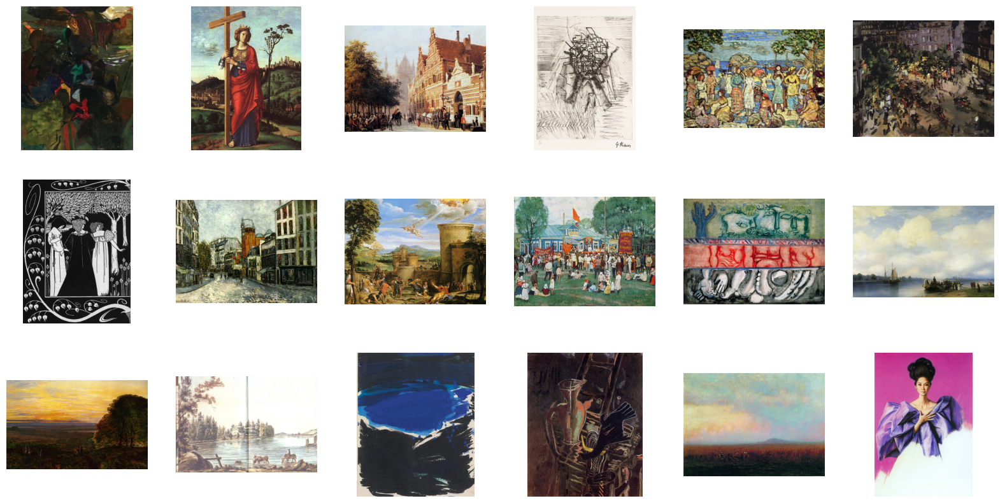

In [36]:
fig, axs = plt.subplots(3, 6, figsize=(20, 10))
axs = axs.flatten()

for i, file in enumerate(style_path[32:50]):
    img = cv2.imread(file)
    axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')
plt.show()

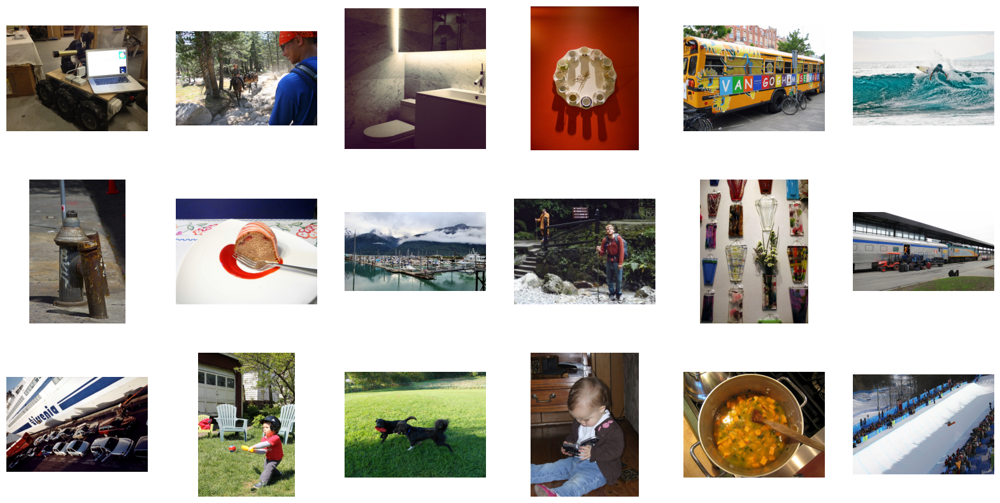

In [37]:
fig, axs = plt.subplots(3, 6, figsize=(20, 10))
axs = axs.flatten()

for i, file in enumerate(content_path[32:50]):
    img = cv2.imread(file)
    axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')
plt.show()

In [38]:
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image, ImageReadMode
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms

In [148]:
class StyleContentDataset(Dataset):
    def __init__(self, style_imgs, content_imgs, transform=None, normalize=None):
        self.style_imgs = style_imgs
        self.content_imgs = content_imgs
        self.transform = transform
        self.normalize = normalize

    def __len__(self):
        if len(self.style_imgs) < len(self.content_imgs):
            return len(self.style_imgs)
        else:
            return len(self.content_imgs)
    
    def __getitem__(self, idx):
        try:
            style = read_image(self.style_imgs[idx], ImageReadMode.RGB).float() / 255.0
            content = read_image(self.content_imgs[idx], ImageReadMode.RGB).float() / 255.0
        except (RuntimeError):
            print(self.style_imgs[idx])
            print(self.content_imgs[idx])

        if self.normalize:
            style = self.normalize(style)
            content = self.normalize(content)
        
        if self.transform:
            style = self.transform(style)
            content = self.transform(content)
        
        return style, content
    

In [149]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform = transforms.Compose([transforms.Resize(256), transforms.RandomCrop(256)])

train_dataset = StyleContentDataset(style_path[:10], content_path[:10], transform=transform, normalize=norm)

In [150]:
style, content = train_dataset[9]

In [151]:
def denorm_img(img: torch.Tensor):
    std = torch.Tensor([0.229, 0.224, 0.225]).reshape(-1, 1, 1)
    mean = torch.Tensor([0.485, 0.456, 0.406]).reshape(-1, 1, 1)
    return torch.clip(img * std + mean, min=0, max=1)

In [152]:
class DataStore():
    def __init__(self, dataset, batch_size, shuffle=False):
        self.dataset = dataset
        self.dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle)
        self.iterator = iter(self.dataloader)

    def get(self):
        try:
           style, content = next(self.iterator)
        except (StopIteration):
            print('| Repeating |')
            self.iterator = iter(self.dataloader)
            style, content = next(self.iterator)
        
        return style, content

### Testing dataset and datastore

In [44]:
def plot_pair(style, content, denorm=False):
    if denorm:
        style, content = denorm_img(style), denorm_img(content)

    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    for i, img in enumerate([style, content]):
        axs[i].imshow(img.permute(1, 2, 0))
        axs[i].axis('off')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


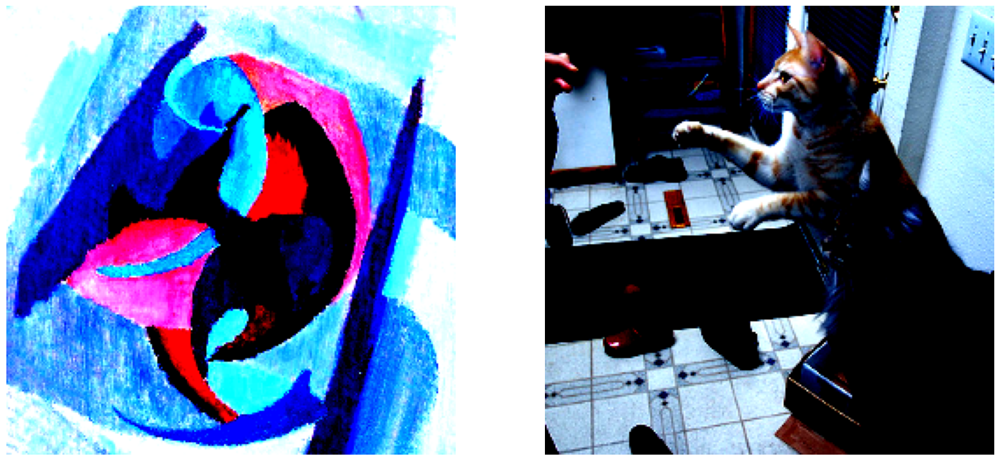

In [45]:
plot_pair(style, content)

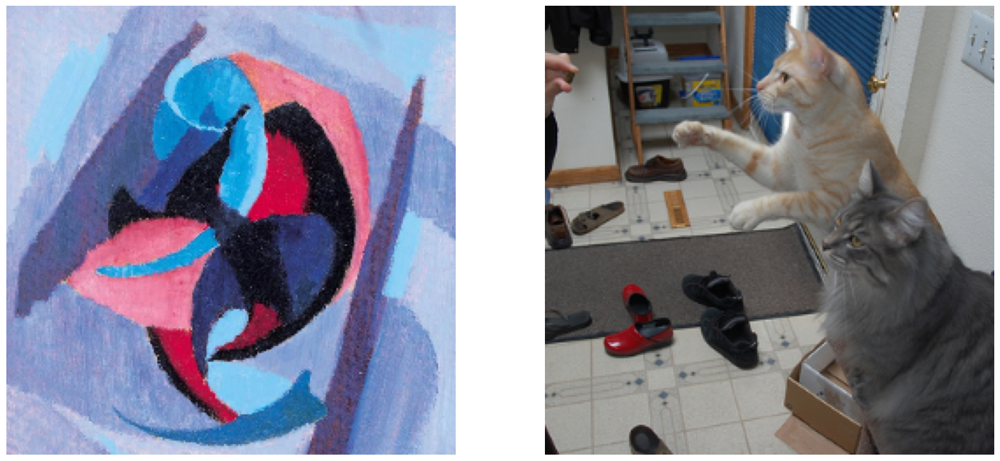

In [46]:
# style, content = denorm_img(style), denorm_img(content)
plot_pair(style, content, denorm=True)

In [47]:
content.shape

torch.Size([3, 256, 256])

In [48]:
style.shape

torch.Size([3, 256, 256])

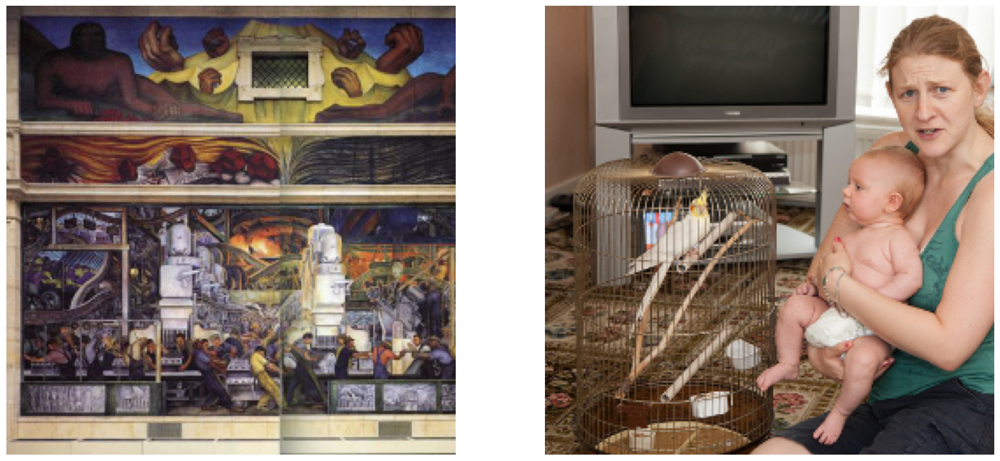

In [49]:
ds = DataStore(train_dataset, batch_size=1)
for i in range(20):
    style, content = ds.get()
    plot_pair(style[0], content[0], denorm=True)
    break

## AdaIN

In [50]:
def mi(x):
    return torch.sum(x, dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3])

def sigma(x, epsilon=1e-5):
    return torch.sqrt(torch.sum(((x - mi(x))**2 + epsilon), dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3]))

In [51]:
class AdaIN(nn.Module):
    def __init__(self, epsilon=1e-5):
        super().__init__()
        self.epsilon = epsilon
    
    # [batch, channels, heigth, width]
    # def mi(self, x):
    #     return torch.sum(x, dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3])

    # def sigma(self, x):
    #     return torch.sqrt(torch.sum(((x - self.mi(x))**2 + self.epsilon), dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3]))

    def forward(self, content, style):
        #return (self.sigma(y) * ((x.permute((2,3,0,1)) - self.mi(x))/self.sigma(x)) + self.mi(y)).permute((2,3,0,1))
        # return (torch.mul(self.sigma(style), ((content - self.mi(content)) / self.sigma(content))) + self.mi(style))
        return (torch.mul(sigma(style, self.epsilon), ((content - mi(content)) / sigma(content, self.epsilon))) + mi(style))


## Style and Content loss

In [71]:
class Loss(nn.Module):
    def __init__(self, lamb=1e-2):
        super().__init__()
        self.lamb = lamb

    def content_loss(self, enc_out, t):
        # print(torch.linalg.norm(enc_out - t))
        # print(F.mse_loss(enc_out, t))
        # return torch.linalg.norm(enc_out - t)
        return F.mse_loss(enc_out, t)
    
    def style_loss(self, out_activations, style_activations):
        means, sds = 0, 0
        for out_act, style_act in zip(out_activations.values(), style_activations.values()):
            # means = torch.linalg.norm(mi(out_act) - mi(style_act))
            # sds = torch.linalg.norm(sigma(out_act) - sigma(style_act))
            # print(means, sds)
            
            means += F.mse_loss(mi(out_act), mi(style_act))
            sds += F.mse_loss(sigma(out_act), sigma(style_act))
            # print(means, sds)
        return means + sds

    def forward(self, enc_out, t, out_activations, style_activations):
        loss_c = self.content_loss(enc_out, t)
        loss_s = self.style_loss(out_activations, style_activations)
        # print(loss_c)
        # print(loss_s)
        
        return (loss_c + self.lamb * loss_s) / t.shape[0]

## Model

In [72]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        #vgg = torch.hub.load('pytorch/vision:v0.10.0', 'vgg19', pretrained=True)
        #self.encoder = list(vgg.children())[0][:21]
        self.encoder = list(vgg19(weights='VGG19_Weights.DEFAULT').children())[0][:21]

        # freeze the encoder
        for param in self.encoder.parameters():
            param.requires_grad = False

        self.AdaIN = AdaIN()
        self.decoder = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Upsample(scale_factor=2.0, mode='nearest'),

            nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Upsample(scale_factor=2.0, mode='nearest'),
            
            nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Upsample(scale_factor=2.0, mode='nearest'),
            
            nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            # nn.ReLU(), # tu mozno nieco ine, kedze to uz je finalny vystup
        )

    def forward(self, content, style):
        enc_content = self.encoder(content)
        enc_style = self.encoder(style)
        
        self.t = self.AdaIN(enc_content, enc_style)
        out = self.decoder(self.t)
        #out_t = self.encoder(out)
        
        return out
    
model = NeuralNetwork().to('mps')

In [54]:
summary(model)

Layer (type:depth-idx)                   Param #
NeuralNetwork                            --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       (1,792)
│    └─ReLU: 2-2                         --
│    └─Conv2d: 2-3                       (36,928)
│    └─ReLU: 2-4                         --
│    └─MaxPool2d: 2-5                    --
│    └─Conv2d: 2-6                       (73,856)
│    └─ReLU: 2-7                         --
│    └─Conv2d: 2-8                       (147,584)
│    └─ReLU: 2-9                         --
│    └─MaxPool2d: 2-10                   --
│    └─Conv2d: 2-11                      (295,168)
│    └─ReLU: 2-12                        --
│    └─Conv2d: 2-13                      (590,080)
│    └─ReLU: 2-14                        --
│    └─Conv2d: 2-15                      (590,080)
│    └─ReLU: 2-16                        --
│    └─Conv2d: 2-17                      (590,080)
│    └─ReLU: 2-18                        --
│    └─MaxPool2d: 2

### Configure forward hooks to save activations

In [55]:
activations = {}
layers = [1, 6, 11, 20]

In [56]:
# https://stackoverflow.com/a/68854535
def get_activation(name):
    def hook(module, input, output):
        activations[name] = output.detach()
    return hook

In [57]:
for i, module in enumerate(model.encoder.children()):
    if i in layers:
        module.register_forward_hook(get_activation(i))
        # print(i, module)

## Training

In [169]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform = transforms.Compose([transforms.Resize(256), transforms.RandomCrop(256)])

style_path = glob.glob('data/styles/*.jpg')
content_path = glob.glob('data/content/*.jpg')

train_dataset = StyleContentDataset(style_path[:1000], content_path[:1000], transform=transform, normalize=norm)

In [170]:
def train_one_iter(i, ds, optimizer, loss_fn: Loss):
    style, content = ds.get()
    style, content = style.to('mps'), content.to('mps')

    # Forward
    out = model(content, style)

    style_activations = copy.deepcopy(activations)
    enc_out = model.encoder(out)

    out_activations = activations

    loss = loss_fn(enc_out, model.t, out_activations, style_activations)

    # Update parameters
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    return loss.cpu().detach()

In [171]:
def show_progress():
    pass

In [172]:
def train():
    train_history = {'style_loss': [], 'content_loss': [], 'loss': []}
    ds = DataStore(train_dataset, batch_size=8, shuffle=False)

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    loss_fn = Loss()

    for i in range(800):
        loss = train_one_iter(i, ds, optimizer, loss_fn)
        train_history['loss'].append(loss)
        # style, content = ds.get()

        # if i%10 == 0:
        print(f"Iter {i}")
        print(f"loss: {train_history['loss'][i]:>5f}")
        print('-------------------------------')

    return train_history


In [173]:
history = train()

Iter 0
loss: 2.143930
-------------------------------
Iter 1
loss: 1.893554
-------------------------------
Iter 2
loss: 1.648933
-------------------------------
Iter 3
loss: 1.899811
-------------------------------
Iter 4
loss: 2.042820
-------------------------------
Iter 5
loss: 1.379748
-------------------------------
Iter 6
loss: 1.714684
-------------------------------
Iter 7
loss: 1.163573
-------------------------------
Iter 8
loss: 1.631143
-------------------------------
Iter 9
loss: 1.323633
-------------------------------
Iter 10
loss: 1.330906
-------------------------------
Iter 11
loss: 1.694962
-------------------------------
Iter 12
loss: 1.450785
-------------------------------
Iter 13
loss: 2.048711
-------------------------------
Iter 14
loss: 1.829750
-------------------------------
Iter 15
loss: 1.459432
-------------------------------
Iter 16
loss: 1.638806
-------------------------------
Iter 17
loss: 1.386720
-------------------------------
Iter 18
loss: 1.6210

In [174]:
fig = px.line({'loss': history['loss']})
fig.show()

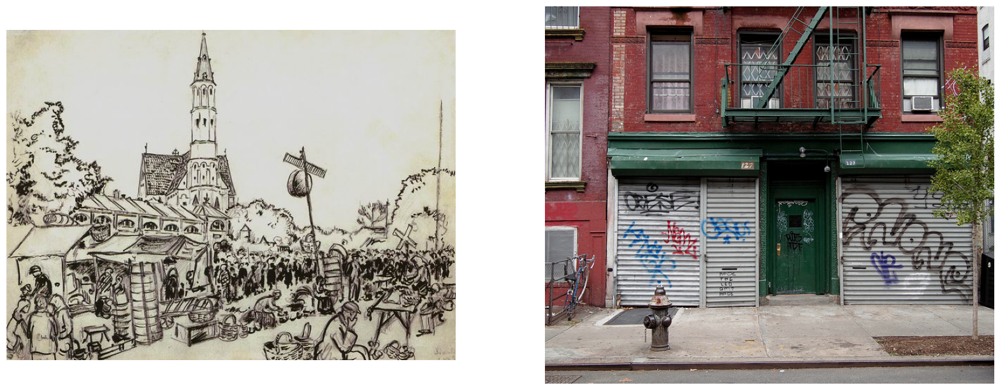

In [199]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform = transforms.Compose([transforms.Resize(256), transforms.RandomCrop(256)])

with torch.no_grad():
    # ds = DataStore(train_dataset, batch_size=1)

    style = read_image('data/styles/9.jpg', ImageReadMode.RGB).float() / 255.0
    content = read_image('data/content/000000008899.jpg', ImageReadMode.RGB).float() / 255.0

    plot_pair(style, content)

    style = style.unsqueeze(0)
    content = content.unsqueeze(0)

    style = norm(style)
    content = norm(content)
    
    style, content = style.to('mps'), content.to('mps')

    out = model(content, style)

(-0.5, 639.5, 535.5, -0.5)

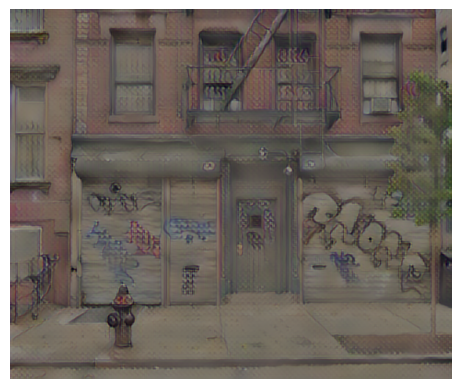

In [200]:
out = out.cpu()

denorm_out = denorm_img(out)
plt.imshow(denorm_out[0].permute(1, 2, 0))
plt.axis(False)

(-0.5, 639.5, 535.5, -0.5)

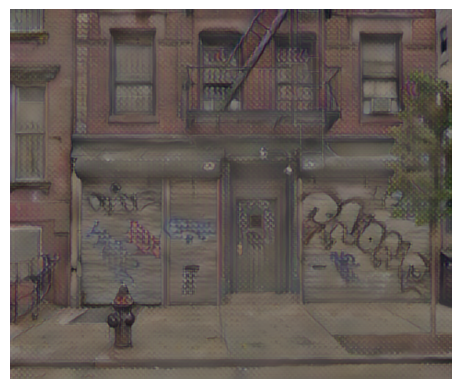

In [186]:
out = out.cpu()

denorm_out = denorm_img(out)
plt.imshow(denorm_out[0].permute(1, 2, 0))
plt.axis(False)

(-0.5, 639.5, 535.5, -0.5)

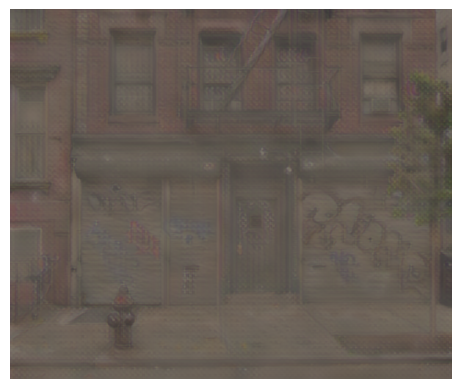

In [184]:
out = out.cpu()

denorm_out = denorm_img(out)
plt.imshow(denorm_out[0].permute(1, 2, 0))
plt.axis(False)

## Playground

### Testing some stuff 

In [ ]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'vgg19', pretrained=True)
summary(model)

Using cache found in /Users/kuko/.cache/torch/hub/pytorch_vision_v0.10.0
/Users/kuko/miniconda3/envs/cv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/kuko/miniconda3/envs/cv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                   Param #
VGG                                      --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       1,792
│    └─ReLU: 2-2                         --
│    └─Conv2d: 2-3                       36,928
│    └─ReLU: 2-4                         --
│    └─MaxPool2d: 2-5                    --
│    └─Conv2d: 2-6                       73,856
│    └─ReLU: 2-7                         --
│    └─Conv2d: 2-8                       147,584
│    └─ReLU: 2-9                         --
│    └─MaxPool2d: 2-10                   --
│    └─Conv2d: 2-11                      295,168
│    └─ReLU: 2-12                        --
│    └─Conv2d: 2-13                      590,080
│    └─ReLU: 2-14                        --
│    └─Conv2d: 2-15                      590,080
│    └─ReLU: 2-16                        --
│    └─Conv2d: 2-17                      590,080
│    └─ReLU: 2-18                        --
│    └─MaxPool2d: 2-19             

In [ ]:
sliced_vgg = list(model.children())[0][:21]

In [ ]:
arr = np.random.randint(1, 10, (2, 3, 4, 4))

In [ ]:
i, j = 1, 1
for layer in sliced_vgg:
    print(f'{i}_{j} {layer}')
    j += 1
    if str(layer)[0] == 'M':
        j = 1
        i += 1
        print()

1_1 Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_2 ReLU(inplace=True)
1_3 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_4 ReLU(inplace=True)
1_5 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

2_1 Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_2 ReLU(inplace=True)
2_3 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_4 ReLU(inplace=True)
2_5 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

3_1 Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_2 ReLU(inplace=True)
3_3 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_4 ReLU(inplace=True)
3_5 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_6 ReLU(inplace=True)
3_7 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_8 ReLU(inplace=True)
3_9 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

4_1 Co

In [ ]:
reversed_encoder = list(reversed(sliced_vgg))

In [ ]:
#decoder = reversed(sliced_vgg)

decoder = []

for i, layer in enumerate(reversed_encoder):
    if type(layer) == nn.MaxPool2d:
        decoder[i] = nn.Upsample(scale_factor=2, mode='nearest')
    
    elif type(layer) == nn.Conv2d:
        tmp = layer.in_channels 
        layer.in_channels = layer.out_channels
        layer.out_channels = tmp
    
    elif type(layer) == nn.Conv2d:
        tmp = layer.in_channels 
        layer.in_channels = layer.out_channels
        layer.out_channels = tmp

        # if type(decoder[i-1] == nn.ReLU):
        #     tmp = layer
        #     #print(i, i+1)
        #     decoder[i] = decoder[i-1]
        #     decoder[i-1] = tmp

    # elif type(layer) == nn.ReLU and type(decoder[i+1]) == nn.Conv2d:
    #     tmp = layer
    #     print(i, i+1)
    #     decoder[i] = decoder[i+1]
    #     decoder[i+1] = tmp

IndexError: list assignment index out of range

In [ ]:
i, j = 1, 1
for layer in decoder:
    print(f'{i}_{j} {layer}')
    j += 1
    if str(layer)[0] == 'U':
        j = 1
        i += 1
        print()

1_1 ReLU(inplace=True)
1_2 ReLU(inplace=True)
1_3 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_4 Upsample(scale_factor=2.0, mode=nearest)

2_1 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_2 ReLU(inplace=True)
2_3 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_4 ReLU(inplace=True)
2_5 Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_6 ReLU(inplace=True)
2_7 ReLU(inplace=True)
2_8 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_9 Upsample(scale_factor=2.0, mode=nearest)

3_1 Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_2 ReLU(inplace=True)
3_3 ReLU(inplace=True)
3_4 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_5 Upsample(scale_factor=2.0, mode=nearest)

4_1 Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
4_2 Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
4_3 ReLU(inplace=True)


---

In [ ]:
arr

array([[[[6, 2, 3, 8],
         [2, 9, 4, 5],
         [8, 1, 7, 7],
         [7, 9, 1, 7]],

        [[6, 8, 2, 8],
         [2, 1, 1, 3],
         [4, 8, 1, 6],
         [5, 1, 6, 9]],

        [[9, 4, 4, 8],
         [3, 5, 1, 1],
         [4, 9, 3, 8],
         [5, 3, 7, 2]]],


       [[[8, 1, 7, 5],
         [4, 9, 9, 8],
         [5, 3, 1, 7],
         [2, 6, 1, 6]],

        [[4, 5, 6, 1],
         [7, 8, 1, 3],
         [8, 1, 2, 3],
         [9, 3, 7, 4]],

        [[2, 8, 3, 1],
         [6, 1, 7, 7],
         [2, 6, 9, 3],
         [2, 3, 3, 7]]]])

In [ ]:
arr[0, 0]

array([[6, 2, 3, 8],
       [2, 9, 4, 5],
       [8, 1, 7, 7],
       [7, 9, 1, 7]])

In [ ]:
np.sum(arr[0, 0])

86

In [ ]:
np.sum(arr, axis=(2, 3))/(arr.shape[2]*arr.shape[3])

array([[5.375 , 4.4375, 4.75  ],
       [5.125 , 4.5   , 4.375 ]])

In [ ]:
x = torch.as_tensor(arr, dtype=torch.float32)
y = torch.randint(1, 10, (2, 3, 4, 4))

In [ ]:
mi = AdaIN().mi(x)
mi

tensor([[5.3750, 4.4375, 4.7500],
        [5.1250, 4.5000, 4.3750]])

In [ ]:
mi = AdaIN().mi(x)
mi

tensor([[[[5.3750]],

         [[4.4375]],

         [[4.7500]]],


        [[[5.1250]],

         [[4.5000]],

         [[4.3750]]]])

In [ ]:
x.permute([2,3,0,1]).shape

torch.Size([4, 4, 2, 3])

In [ ]:
torch.sum((x-mi)**2, (2, 3))

tensor([[119.7500, 127.9375, 109.0000],
        [121.7500, 110.0000, 107.7500]])

In [ ]:
torch.sum((x.permute([2,3,0,1])-mi).permute([2,3,0,1])**2, (2, 3))

tensor([[119.7500, 127.9375, 109.0000],
        [121.7500, 110.0000, 107.7500]])

In [ ]:
epsilon = 1e-5

In [ ]:
torch.sqrt(torch.sum((x-mi+epsilon)**2, (2, 3))/(x.shape[2]*x.shape[3]))

tensor([[2.7358, 2.8277, 2.6101],
        [2.7585, 2.6220, 2.5951]])

In [ ]:
torch.sqrt(torch.sum((x.permute([2,3,0,1])-mi+epsilon)**2, (0, 1))/(x.shape[2]*x.shape[3]))

tensor([[2.7358, 2.8277, 2.6101],
        [2.7585, 2.6220, 2.5951]])

In [ ]:
AdaIN().sigma(x)

tensor([[2.7358, 2.8277, 2.6101],
        [2.7585, 2.6220, 2.5951]])

In [ ]:
AdaIN().forward(x, y)

tensor([[[[ 5.1308,  1.0934,  2.1028,  7.1495],
          [ 1.0934,  8.1589,  3.1121,  4.1215],
          [ 7.1495,  0.0841,  6.1402,  6.1402],
          [ 6.1402,  8.1589,  0.0841,  6.1402]],

         [[ 5.4933,  7.0846,  2.3105,  7.0846],
          [ 2.3105,  1.5148,  1.5148,  3.1062],
          [ 3.9019,  7.0846,  1.5148,  5.4933],
          [ 4.6976,  1.5148,  5.4933,  7.8803]],

         [[ 9.6534,  4.3259,  4.3259,  8.5879],
          [ 3.2603,  5.3914,  1.1293,  1.1293],
          [ 4.3259,  9.6534,  3.2603,  8.5879],
          [ 5.3914,  3.2603,  7.5224,  2.1948]]],


        [[[ 7.8063,  0.9736,  6.8302,  4.8780],
          [ 3.9019,  8.7824,  8.7824,  7.8063],
          [ 4.8780,  2.9258,  0.9736,  6.8302],
          [ 1.9497,  5.8541,  0.9736,  5.8541]],

         [[ 4.0138,  4.9862,  5.9585,  1.0968],
          [ 6.9309,  7.9032,  1.0968,  3.0415],
          [ 7.9032,  1.0968,  2.0691,  3.0415],
          [ 8.8756,  3.0415,  6.9309,  4.0138]],

         [[ 1.8796,  9.7627,

### Testing loss

In [51]:
content = torch.rand((2, 3, 512, 512)).to('mps')
style = torch.rand((2, 3, 512, 512)).to('mps')

In [52]:
enc_content=model.encoder(content)
enc_style=model.encoder(style)

In [53]:
for i, act in enumerate(activations):
    print(i, activations[act].shape)

0 torch.Size([2, 64, 512, 512])
1 torch.Size([2, 128, 256, 256])
2 torch.Size([2, 256, 128, 128])
3 torch.Size([2, 512, 64, 64])


In [54]:
out = model(content, style)

In [55]:
print(enc_content.shape)
print(enc_style.shape)
print(out.shape)

torch.Size([2, 512, 64, 64])
torch.Size([2, 512, 64, 64])
torch.Size([2, 3, 512, 512])


In [56]:
style_activations = copy.deepcopy(activations)

In [57]:
out_enc = model.encoder(out)
out_activations = activations

In [58]:
cr = Loss(1)
loss = cr.forward(out_enc, enc_style, out_activations, style_activations)
loss

tensor(985.4153, device='mps:0', grad_fn=<DivBackward0>)

In [59]:
loss.backward()
loss